<a href="https://colab.research.google.com/github/Gabriela-BF/Minimum-Viable-Product/blob/mvp-machine-learning/MVP_Gabriela_Ferreira.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MVP: Machine Learning & Analytics

**Autor:** Gabriela Bitencourt Ferreira  
**Data:** 28/09/2025  
**Matrícula:** 4052025001187  
**Dataset:** Lipophilicity  
**Tempo de execução:** ~3 minutos*  

<font size="2">*Tabelas `final_results.csv`, `predictions_summary.csv` e `results_all.csv` devem estar na mesma pasta do notebook.</font>

---

## Motivação


A **lipofilicidade** de uma molécula, também conhecida como **hidrofobicidade**, é a sua afinidade por ambientes e substâncias não polares (apolares), como gorduras e óleos.  

Na área farmacêutica, conhecer essa propriedade é fundamental, pois ela influencia diretamente na absorção do medicamento, distribuição no organismo e excreção pelos sistemas de eliminação.  

Desenvolver um modelo de aprendizado de máquina de regressão para **prever a lipofilicidade** é extremamente útil, pois:

- Agiliza a descoberta de novos fármacos;  
- Economiza tempo e recursos;  
- Permite a seleção virtual dos candidatos mais promissores.  

---

## Conjunto de Dados

Neste projeto utilizaremos o dataset **Lipophilicity**, disponível no [Kaggle](https://www.kaggle.com/).  

O conjunto contém:  
- Identificadores das moléculas (SMILES);  
- Valores de **logD em pH 7.4**, obtidos experimentalmente.  

### O que é logD?  
O logD é o coeficiente de partição de uma molécula em um determinado pH, normalmente **7.4**, que corresponde ao pH do sangue humano e dos fluidos extracelulares.  

Representa a razão entre a concentração da substância em um solvente lipofílico e a concentração em água.  

Um valor elevado de logD indica que a molécula tende a ser mais **lipofílica** (afinidade maior por ambientes apolares).   

## 1. Dependências

### 1.1 Bibliotecas

In [157]:
start_time_note = time.time()

In [158]:
'''Instala a biblioteca RDKit, necessária para manipulação química
e extração de descritores moleculares '''

!pip install rdkit

In [159]:
# Bibliotecas para download e manipulação de datasets do Kaggle
import kagglehub
from kagglehub import KaggleDatasetAdapter

# Bibliotecas para trabalhar com moléculas químicas
from rdkit import Chem
from rdkit.ML.Descriptors import MoleculeDescriptors
from rdkit.Chem import Descriptors, AllChem

# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Visualização de dados
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch

# Acesso a pasta do drive
from google.colab import drive
drive.mount('/content/drive')

# Setup básico para projetos de aprendizado de máquina
from scipy.stats import skew, kurtosis, pearsonr, shapiro, spearmanr
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split, StratifiedKFold, KFold, cross_val_score, cross_val_predict, GridSearchCV
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor, BaggingRegressor, ExtraTreesRegressor
import pandas as pd
import numpy as np
import os, random
import time
import joblib
import ast

# Reprodutibilidade
SEED = 42
np.random.seed(SEED)
random.seed(SEED)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### 1.2 Funções
Apresenta a principal função utilizada para análise e avaliação do modelo desenvolvido

- `evaluate_regression(y_true, y_pred)`: Função responsável por avaliar o desempenho de um modelo de regressão. Recebe como entrada os valores reais (`y_true`) e as previsões do modelo (`y_pred`) e retorna um dicionário com as principais métricas:

  - **MAE (Mean Absolute Error)**: Erro médio absoluto entre valores reais e previstos.
  - **RMSE (Root Mean Squared Error)**: Raiz do erro quadrático médio.
  - **R² (Coeficiente de Determinação)**: Proporção da variabilidade explicada pelo modelo.
  - **Spearman (Correlação de Spearman)**: Correlação monotônica entre valores reais e previstos.
  - **Pearson (Correlação de Pearson)**: Correlação linear entre valores reais e previstos.

In [160]:
def evaluate_regression(y_true, y_pred):
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    spearman_corr, _ = spearmanr(y_true, y_pred)
    pearson_corr, _ = pearsonr(y_true, y_pred)
    return {"MAE": mae, "RMSE": rmse, "R2": r2, "Spearman": spearman_corr, "Pearson": pearson_corr}

## 2. Conjunto de dados

### 2.1 Carga de dados

In [161]:
# Download conjunto de dados
dataset_dir = kagglehub.dataset_download("markinsuff/lipophilicity")

# Caminho para o conjunto de dados dentro do banco de dados
file_path = "Lipophilicity.csv"

# Carregar o conjunto de dados na variável df
df = kagglehub.dataset_load(KaggleDatasetAdapter.PANDAS, "markinsuff/lipophilicity", file_path)

# Imprimir o conjunto para checar
print(df.head())

Using Colab cache for faster access to the 'lipophilicity' dataset.
Using Colab cache for faster access to the 'lipophilicity' dataset.
   CMPD_CHEMBLID   exp                                             smiles  \
0   CHEMBL596271  3.54            Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14   
1  CHEMBL1951080 -1.18  COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...   
2     CHEMBL1771  3.69             COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl   
3   CHEMBL234951  3.37  OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...   
4   CHEMBL565079  3.10  Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...   

                                        RDKIT_SMILES  
0            Cn1c(CN2CCN(c3ccc(Cl)cc3)CC2)nc2ccccc21  
1  COc1cc(OC)c(S(=O)(=O)N2c3ccccc3CCC2C)cc1NC(=O)...  
2              COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1  
3  O=C(NC1Cc2ccccc2N(C[C@@H](O)CO)C1=O)c1cc2cc(Cl...  
4  Cc1cccc(C[C@H](NC(=O)c2cc(C(C)(C)C)nn2C)C(=O)N...  


### 2.2 Descritores moleculares

As colunas SMILES do conjunto de dados representam a estrutura das moléculas como strings que descrevem átomos, ligações e aromaticidade.  

Para algoritmos de aprendizado de máquina, SMILES é apenas texto, sem significado químico direto, portanto não é possível extrair padrões úteis apenas a partir deles.  

Por isso, os SMILES são convertidos em **descritores moleculares**: valores numéricos que quantificam propriedades físico-químicas ou estruturais das moléculas, como peso molecular, área superficial polar, número de doadores e aceitadores de hidrogênio, entre outros.  



- Essa célula pode levar em torno de 2 minuto para ser concluída

In [162]:
# Descritores Moleculares (+- 2 min)

# Cria coluna com objeto mol
df["mol"] = df["RDKIT_SMILES"].apply(lambda x: Chem.MolFromSmiles(x))

# Lista de descritores disponíveis
descriptor_names = [desc[0] for desc in Descriptors._descList]

# Criar calculadora
calc = MoleculeDescriptors.MolecularDescriptorCalculator(descriptor_names)

# Extrair descritores diretamente com lambda
desc_values = df["mol"].apply(lambda mol: calc.CalcDescriptors(mol) if mol is not None else [np.nan]*len(descriptor_names))

# Converter para DataFrame
desc_df = pd.DataFrame(desc_values.tolist(), columns=descriptor_names)

# Juntar com o dataset original
df_desc = pd.concat([df, desc_df], axis=1)


In [163]:
df_desc

,CMPD_CHEMBLID,exp,smiles,RDKIT_SMILES,mol,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,CHEMBL596271,3.54,Cn1c(CN2CCN(CC2)c3ccc(Cl)cc3)nc4ccccc14,Cn1c(CN2CCN(c3ccc(Cl)cc3)CC2)nc2ccccc21,<rdkit.Chem.rdchem.Mol object at 0x7b9bae93af10>,5.976320,5.976320,0.790958,0.790958,0.728444,...,0,0,0,0,0,0,0,0,0,0
1,CHEMBL1951080,-1.18,COc1cc(OC)c(cc1NC(=O)CSCC(=O)O)S(=O)(=O)N2C(C)...,COc1cc(OC)c(S(=O)(=O)N2c3ccccc3CCC2C)cc1NC(=O)...,<rdkit.Chem.rdchem.Mol object at 0x7b9bace52110>,13.847757,13.847757,0.083663,-4.060285,0.545587,...,1,1,0,0,0,0,0,0,0,0
2,CHEMBL1771,3.69,COC(=O)[C@@H](N1CCc2sccc2C1)c3ccccc3Cl,COC(=O)[C@H](c1ccccc1Cl)N1CCc2sccc2C1,<rdkit.Chem.rdchem.Mol object at 0x7b9bace52260>,12.294248,12.294248,0.262241,-0.447454,0.807761,...,0,0,0,0,0,0,0,1,0,0
3,CHEMBL234951,3.37,OC[C@H](O)CN1C(=O)C(Cc2ccccc12)NC(=O)c3cc4cc(C...,O=C(NC1Cc2ccccc2N(C[C@@H](O)CO)C1=O)c1cc2cc(Cl...,<rdkit.Chem.rdchem.Mol object at 0x7b9bace522d0>,12.966133,12.966133,0.046181,-1.063518,0.506650,...,0,0,0,0,0,0,0,1,0,0
4,CHEMBL565079,3.10,Cc1cccc(C[C@H](NC(=O)c2cc(nn2C)C(C)(C)C)C(=O)N...,Cc1cccc(C[C@H](NC(=O)c2cc(C(C)(C)C)nn2C)C(=O)N...,<rdkit.Chem.rdchem.Mol object at 0x7b9bace517e0>,12.834652,12.834652,0.112199,-0.795707,0.747686,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4195,CHEMBL496929,3.85,OCCc1ccc(NC(=O)c2cc3cc(Cl)ccc3[nH]2)cc1,O=C(Nc1ccc(CCO)cc1)c1cc2cc(Cl)ccc2[nH]1,<rdkit.Chem.rdchem.Mol object at 0x7b9bacfadd90>,12.263937,12.263937,0.114415,-0.206268,0.688505,...,0,0,0,0,0,0,0,0,0,0
4196,CHEMBL199147,3.21,CCN(C1CCN(CCC(c2ccc(F)cc2)c3ccc(F)cc3)CC1)C(=O...,CCN(C(=O)Cc1ccc(S(C)(=O)=O)cc1)C1CCN(CCC(c2ccc...,<rdkit.Chem.rdchem.Mol object at 0x7b9bacfade00>,13.543113,13.543113,0.034005,-3.267070,0.334738,...,0,0,1,0,0,0,0,0,0,0
4197,CHEMBL15932,2.10,COc1cccc2[nH]ncc12,COc1cccc2[nH]ncc12,<rdkit.Chem.rdchem.Mol object at 0x7b9bacfade70>,5.125787,5.125787,0.857639,0.857639,0.666148,...,0,0,0,0,0,0,0,0,0,0
4198,CHEMBL558748,2.65,Clc1ccc2ncccc2c1C(=O)NCC3CCCCC3,O=C(NCC1CCCCC1)c1c(Cl)ccc2ncccc12,<rdkit.Chem.rdchem.Mol object at 0x7b9bacfadee0>,12.498811,12.498811,0.093358,-0.093358,0.923057,...,0,0,0,0,0,0,0,0,0,0


### 2.3 Divisão dos dados

Nesta etapa, será utilizada a técnica de **holdout** para dividir o conjunto de dados de moléculas em **conjunto de treino** e **conjunto de teste**.

In [164]:
# Renomeia a coluna 'exp' para 'logD' para tornar o nome mais descritivo
df_desc = df_desc.rename(columns={"exp": "logD"})

# Seleciona apenas colunas numéricas
df_numeric = df_desc.select_dtypes(include=['int64', 'float64'])

# Define o alvo (target) e as variáveis preditoras (features)
target = "logD"
features = [c for c in df_numeric.columns if c not in [target]]

# Cria cópias de X (features) e y (target)
x = df_numeric[features].copy()
y = df_numeric[target].copy()

In [165]:
# Divide os dados em conjuntos de treino e teste usando holdout (80% treino, 20% teste)
x_train, x_test, y_train, y_test = train_test_split(
    x,
    y,
    test_size=0.2,
    random_state=SEED,
    stratify=None  # Deve ser None para regressão
)

print("Treino:", x_train.shape, "| Teste:", x_test.shape)

# Cria folds para validação cruzada (cross-validation)
num_particoes = 10
kfold = KFold(n_splits=num_particoes, shuffle=True, random_state=7)

Treino: (3360, 217) | Teste: (840, 217)


### 2.5 Análise exploratória

1. **Distribuição e Normalidade da variável alvo**

O gráfico mostra que a maioria das amostras possui valores de **logD** entre 2 e 3, refletindo a realidade de compostos bioativos usados no desenvolvimento de fármacos.

Segundo a Regra dos Cinco de Lipinski, que prevê a biodisponibilidade oral de um composto, o logP (ou logD em pH neutro) deve ser menor que 5. Compostos com logD muito alto tendem a ser insolúveis e difíceis de absorver pelo corpo. Na prática, a maioria dos fármacos aprovados e candidatos a fármacos apresentam logD dentro de uma faixa ideal para equilibrar solubilidade em água e permeabilidade por membranas lipídicas, geralmente entre 1 e 3.

O **Teste de Shapiro-Wilk** indica que os dados não seguem uma distribuição normal: o valor do teste foi 0.971, próximo de 1, sugerindo algum desvio da normalidade perfeita. O valor-p obtido foi extremamente pequeno (p = 3.498×10⁻²⁸), muito menor que o nível de significância de 0,05, confirmando que os dados não são normais.  

O **histograma com curva de densidade** também evidencia a não normalidade: a distribuição não é simétrica, se estende mais à esquerda (valores menores) e apresenta um pico (moda) à direita.




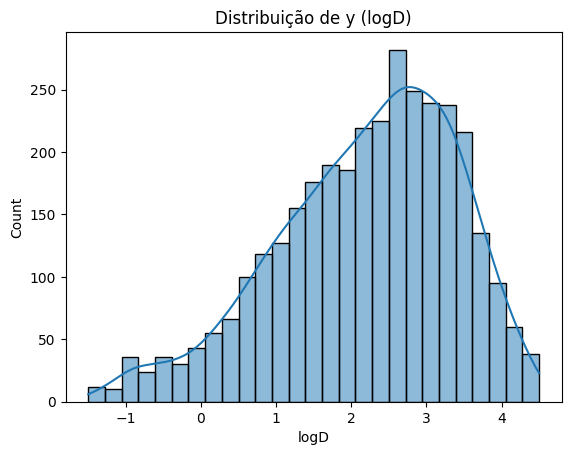

Shapiro-Wilk Test: stat=0.971, p=3.4982909938696577e-28


In [166]:
# Cria uma cópia do conjunto de treino para visualização
df_temp = x_train.copy()
df_temp['logD'] = y

# Plota a distribuição da variável alvo com histograma e curva de densidade (KDE)
sns.histplot(df_temp['logD'], kde=True)
plt.title("Distribuição de y (logD)")
plt.show()

# Teste de normalidade Shapiro-Wilk na variável alvo
stat, p = shapiro(y)
print(f"Shapiro-Wilk Test: stat={stat:.3}, p={p}")

2. **Boxplot da variável alvo**

No boxplot da variável alvo (**logD**), é possível observar alguns pontos à esquerda do gráfico, especificamente valores menores que -1, que representam **outliers**.

Optei por **não remover esses dados**, pois eles refletem a realidade. Valores negativos não são erros de medição, eles existem na natureza. Por exemplo, moléculas hidrofílicas, como alguns aminoácidos ou fármacos, possuem logD negativo.  

Remover esses dados faria com que o modelo desenvolvido não aprendesse a prever corretamente o comportamento de moléculas com essas características.


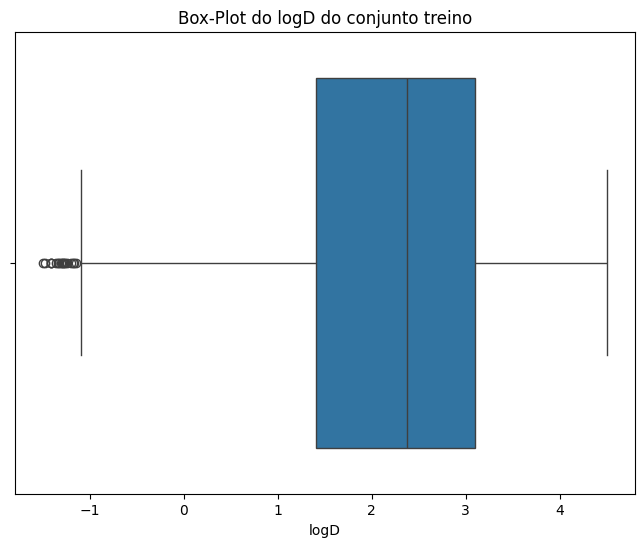

In [167]:
# Cria um boxplot da variável alvo do conjunto de treino

plt.figure(figsize=(8, 6))
sns.boxplot(x=y_train)
plt.title('Box-Plot do logD do conjunto treino')
plt.show()

3. **Correlação da variável alvo com as variáveis preditoras**

Os resultados indicam que **MolLogP** (correlação de 0,42) é o preditor mais forte para o **logD**, mostrando uma relação linear positiva consistente com a química de distribuição molecular, embora a dispersão dos dados sugira que outros fatores também influenciam. Isso é esperado, pois ambos são descritores de lipofilicidade (afinidade por gordura/óleo) de uma molécula.

Variáveis de contagem, como **fr_COO** (e fr_COO2) com correlação de 0,35, e **NumAromaticRings** e **RingCount** com correlações em torno de 0,30, também apresentam tendências positivas. Vale notar que essas são variáveis discretas, com **fr_COO** atuando essencialmente como um indicador binário/categórico.


Top 5 features mais correlacionadas com logD:
Index(['MolLogP', 'fr_COO2', 'fr_COO', 'NumAromaticRings', 'RingCount'], dtype='object')


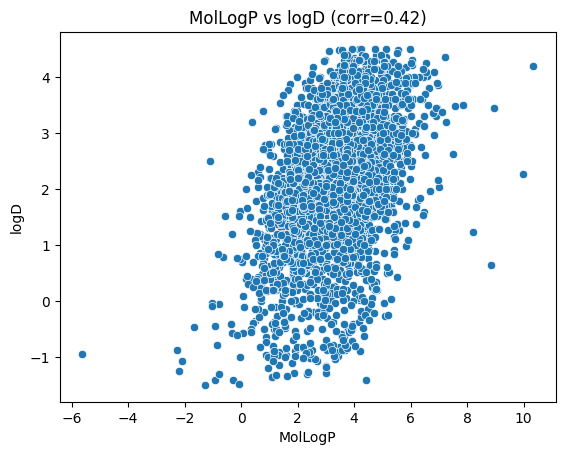

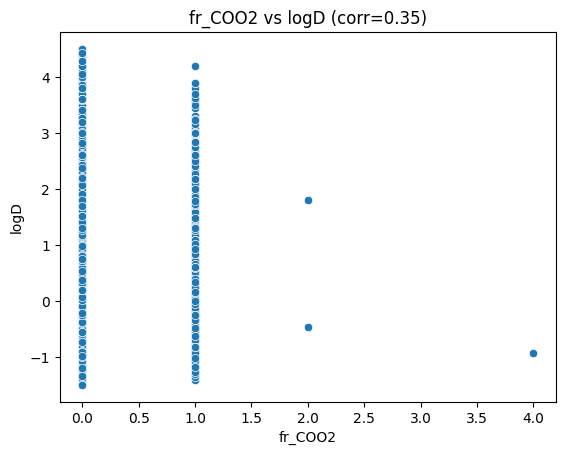

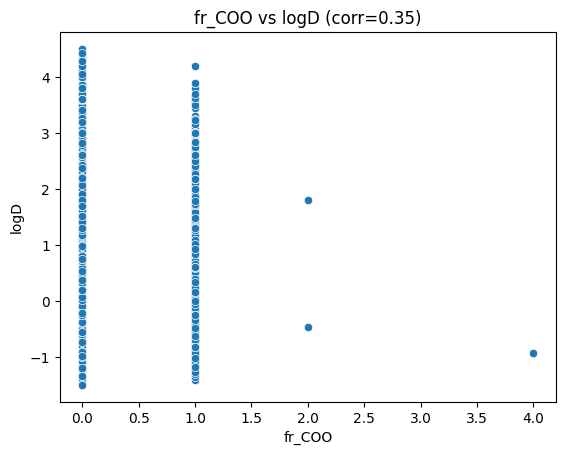

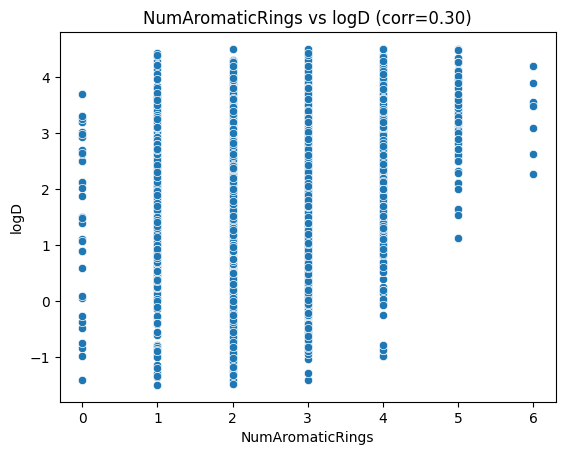

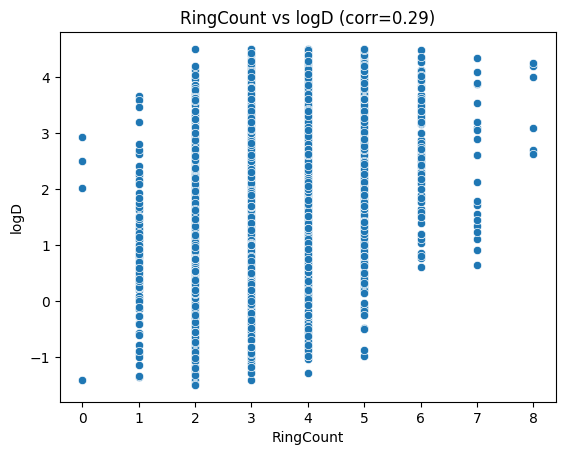

In [168]:
# Combina x_train e y temporariamente para calcular correlações
df_temp = x_train.copy()
df_temp['logD'] = y

# Calcula a correlação de cada feature com a variável alvo
correlations = df_temp.corr()['logD'].abs().sort_values(ascending=False)

# Seleciona as 5 features mais correlacionadas com a variável alvo
top5_features = correlations.drop('logD').head(5).index

print("Top 5 features mais correlacionadas com logD:")
print(top5_features)

# Plota scatterplots para essas 5 features mais correlacionadas
for col in top5_features:
    corr_value = correlations[col]
    sns.scatterplot(x=df_temp[col], y=df_temp['logD'])
    plt.title(f'{col} vs logD (corr={corr_value:.2f})')
    plt.xlabel(col)
    plt.ylabel('logD')
    plt.show()

## 3. Modelagem

### 3.1 Baseline e modelos candidatos

Nesta etapa, rodamos vários **modelos de regressão** com seus parâmetros padrão, para termos uma ideia de como eles se comportam com os nossos dados. Também iremos comparar diferentes métodos de **pré-processamento** e como eles afetam o desempenho desses modelos.

O código verifica se a pasta `modelos` ou o arquivo `results_all.csv` já existem no diretório. Caso existam, ele utiliza os resultados ou modelos já treinados. Caso contrário, o código realizará o treinamento dos modelos ausentes.

Se for necessário treinar todos os modelos novamente, esta etapa pode levar **mais de 30 minutos** para ser concluída.

> Observação: o **GradientBoostingRegressor** foi removido da lista de modelos devido ao tempo de execução elevado, especialmente ao rodar no Google Colab.


In [169]:
# Configurações iniciais para validação cruzada e métrica de avaliação
kfold = KFold(n_splits=5, shuffle=True, random_state=7)
scoring = 'neg_mean_squared_error'

# Criacao da pasta para salvar os modelos
model_dir = "/content/drive/MyDrive/models"

# Cria a pasta apenas se ela não existir
if not os.path.exists(model_dir):
    os.makedirs(model_dir)
    print(f"Created folder: {model_dir}")

# Inicializa listas e dicionários para armazenar resultados e modelos
results = []
names_models = []
summary_results = []
cleaned_models = {}
models = []

# Pipelines de pré-processamento
# Padronização (z-score)
numeric_pipe_standard = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", StandardScaler())
])

# Normalização Min-Max (valores entre 0 e 1)
numeric_pipe_minmax = Pipeline([
    ("imputer", SimpleImputer(strategy="median")),
    ("scaler", MinMaxScaler())
])

# Sem escalonamento, apenas imputação
numeric_pipe_none = Pipeline([
    ("imputer", SimpleImputer(strategy="median"))
])

# Hiperparâmetros padrão para algoritmos ensemble
num_trees = 100
max_features = 3

# Lista de algoritmos a serem avaliados
base_models = [
    ('Dummy', DummyRegressor(strategy="median")),
    ('LR', LinearRegression()),
    ('Ridge', Ridge()),
    ('Lasso', Lasso()),
    ('KNN', KNeighborsRegressor()),
    ('CART', DecisionTreeRegressor()),
    ('SVM', SVR()),

# Ensembles
    ('RF', RandomForestRegressor(
        n_estimators=num_trees, max_features=max_features, random_state=7)),

    ('ExtraTrees', ExtraTreesRegressor(
        n_estimators=num_trees, max_features=max_features, random_state=7)),

    ('Bagging', BaggingRegressor(
        n_estimators=num_trees, random_state=7)),

    ('AdaBoost', AdaBoostRegressor(
        n_estimators=num_trees, random_state=7)),

# GradientBoostingRegressor foi comentado para reduzir tempo de execução
#    ('GB', GradientBoostingRegressor(
#        n_estimators=num_trees, max_features=max_features, random_state=7))
]

# Criação de pipelines combinando pré-processamento e modelos
for name, model in base_models:
    models.append((f"{name}-orig", Pipeline([("pre", numeric_pipe_none), ("model", model)])))
    models.append((f"{name}-std", Pipeline([("pre", numeric_pipe_standard), ("model", model)])))
    models.append((f"{name}-norm", Pipeline([("pre", numeric_pipe_minmax), ("model", model)])))


In [170]:
# Avaliando cada modelo da lista de pipelines
for name, model in models:
    results_csv = os.path.join(model_dir, "results_all.csv")

    # Verifica se existe um arquivo results_all.csv
    if os.path.exists(results_csv):
        df_results = pd.read_csv(results_csv)
        if name in df_results['Modelo'].values:
            print(f"Modelo {name} já presente em results_all.csv, pulando treinamento")
            # Pula o treinamento e avaliação caso o modelo já exista
            continue

    # Se o modelo não existir, treina-o
    print(f"Training model: {name}")
    start_time = time.time()

    # Treinamento do modelo com cross-validation
    y_pred = cross_val_predict(model, x_train, y_train, cv=kfold)
    cv_results = cross_val_score(model, x_train, y_train, cv=kfold, scoring='neg_mean_squared_error')

    # Calcula o tempo que demorou para treinar o modelo
    elapsed_time = time.time() - start_time

    # Salvar resultados e nome do modelo sendo treinado
    results.append(-cv_results)
    names_models.append(name)
    cv_mse_folds = (-cv_results).tolist()

    # Métricas para avaliacao
    metrics = evaluate_regression(y_train, y_pred)

    # Salva as métricas de cada modelo
    summary_results.append({
        "Modelo": name,
        "MAE": metrics["MAE"],
        "RMSE": metrics["RMSE"],
        "R2": metrics["R2"],
        "Spearman": metrics["Spearman"],
        "Pearson": metrics["Pearson"],
        "Tempo(s)": elapsed_time,
        "CV_MSE": cv_mse_folds,
        "y_train": y_train.tolist(),
        "y_pred": y_pred.tolist()
    })
    # Imprime métricas resumidas
    print(f'{name}: MAE {metrics["MAE"]:.3f} - RMSE {metrics["RMSE"]:.3f} - R2 {metrics["R2"]:.3f} - Spearman {metrics["Spearman"]:.3f} - Pearson {metrics["Pearson"]:.3f}')


Modelo Dummy-orig já presente em results_all.csv, pulando treinamento
Modelo Dummy-std já presente em results_all.csv, pulando treinamento
Modelo Dummy-norm já presente em results_all.csv, pulando treinamento
Modelo LR-orig já presente em results_all.csv, pulando treinamento
Modelo LR-std já presente em results_all.csv, pulando treinamento
Modelo LR-norm já presente em results_all.csv, pulando treinamento
Modelo Ridge-orig já presente em results_all.csv, pulando treinamento
Modelo Ridge-std já presente em results_all.csv, pulando treinamento
Modelo Ridge-norm já presente em results_all.csv, pulando treinamento
Modelo Lasso-orig já presente em results_all.csv, pulando treinamento
Modelo Lasso-std já presente em results_all.csv, pulando treinamento
Modelo Lasso-norm já presente em results_all.csv, pulando treinamento
Modelo KNN-orig já presente em results_all.csv, pulando treinamento
Modelo KNN-std já presente em results_all.csv, pulando treinamento
Modelo KNN-norm já presente em results

In [171]:
# Convertendo summary_results para DataFrame
df_summary = pd.DataFrame(summary_results)

# Função para decidir df_results final
if os.path.exists(results_csv):
    df_results_all = pd.read_csv(results_csv)

    if df_summary.empty:
        # Caso summary_results esteja vazio, usar results_all
        df_results = df_results_all
    else:
        # Caso haja conteúdo em ambos, fazer merge
        df_results = pd.concat([df_summary, df_results_all], ignore_index=True)
else:
    # Caso não exista results_all, usar summary_results
    df_results = df_summary

# Remover duplicatas considerando apenas o nome do modelo
df_results = df_results.drop_duplicates(subset='Modelo', keep='first')

# Ordenando pelo RMSE e arredondando
df_results = df_results.sort_values(by='RMSE').round(3)

# Copiar df_results excluindo modelos que terminam com '_hiper'
df_results_filtered = df_results[~df_results['Modelo'].str.endswith('_hiper')].copy()

df_results_filtered

,Modelo,MAE,RMSE,R2,Spearman,Pearson,Tempo(s),CV_MSE,y_train,y_pred
1,SVM-std,5.110000e-01,6.870000e-01,6.720000e-01,0.814,0.822,14.139,"[0.4879851294976194, 0.45218570791020984, 0.47...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0499013765530787, 1.5997206632515129, 3.188..."
2,Bagging-std,5.400000e-01,7.130000e-01,6.470000e-01,0.797,0.806,379.360,"[0.552248141182765, 0.508917393982785, 0.52834...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.963133333333334, 1.6026999999999996, 2.9627..."
3,Bagging-norm,5.420000e-01,7.140000e-01,6.450000e-01,0.796,0.806,377.174,"[0.5511516686603616, 0.5111553338951739, 0.529...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.9813333333333354, 1.5674, 2.979416666666667..."
4,Bagging-orig,5.410000e-01,7.140000e-01,6.450000e-01,0.796,0.805,397.080,"[0.5511273706875167, 0.5091103167524553, 0.533...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.998400000000001, 1.5546, 2.963183333333335,..."
5,SVM-norm,5.710000e-01,7.430000e-01,6.160000e-01,0.780,0.791,13.959,"[0.5982099841058519, 0.5579961644162222, 0.540...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.170181796617884, 1.6751418509982599, 2.8102..."
8,ExtraTrees-std,5.950000e-01,7.870000e-01,5.690000e-01,0.772,0.777,10.782,"[0.661941092626488, 0.6070423986755953, 0.6262...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.2135000000000016, 1.6999999999999986, 2.987..."
9,ExtraTrees-norm,5.990000e-01,7.890000e-01,5.670000e-01,0.772,0.776,7.621,"[0.660073786376488, 0.6201560187872024, 0.6316...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.028500000000001, 1.6999999999999986, 3.0263..."
10,ExtraTrees-orig,5.990000e-01,7.900000e-01,5.660000e-01,0.772,0.775,15.149,"[0.6730892876190476, 0.6172112039434525, 0.626...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[1.9708000000000008, 1.6999999999999986, 3.072..."
12,RF-std,6.190000e-01,8.010000e-01,5.540000e-01,0.764,0.777,11.169,"[0.6875129536715257, 0.6466534759696774, 0.624...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0568999999999993, 1.7861000000000002, 2.980..."
13,RF-norm,6.200000e-01,8.040000e-01,5.510000e-01,0.764,0.775,11.280,"[0.6809078042295154, 0.6462689540448792, 0.643...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[1.9279000000000004, 1.7834, 2.982630952380953..."


### 3.2 Avaliação dos modelos com o conjunto de treino

1. **Análise do MSE**

A avaliação inicial do desempenho dos modelos foi realizada com **boxplots do MSE** obtido em cada fold da validação cruzada.

O gráfico mostra a presença de **outliers de MSE extremamente altos** (na ordem de 10²⁹), ocorrendo quase que exclusivamente nos modelos de Regressão Linear (`LR-orig`, `LR-std`, `LR-norm`) e nos modelos Ridge/Lasso (com o LR sendo o mais afetado).  

Isso indica que, em pelo menos um fold da validação cruzada, esses modelos tiveram um desempenho extremamente ruim, gerando erros excepcionalmente grandes em algumas partições dos dados.


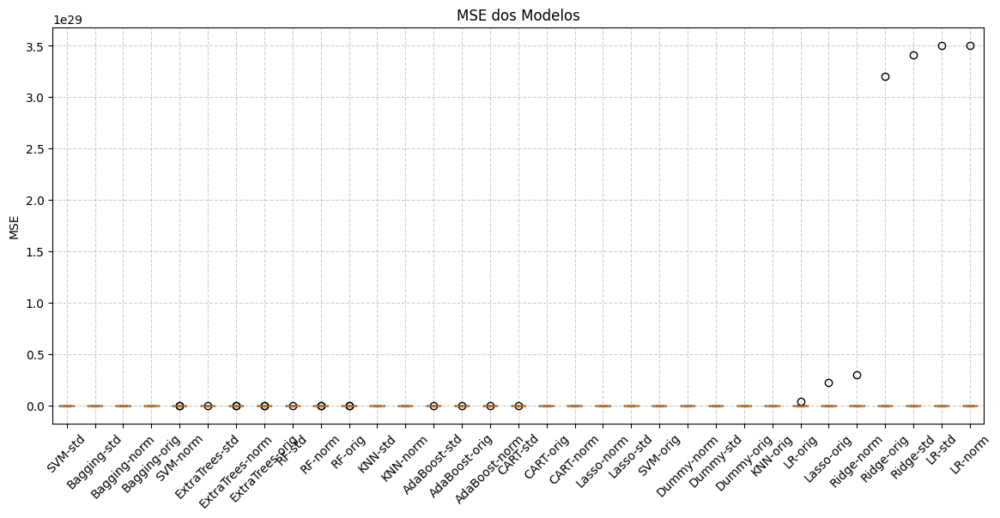

In [172]:
# Boxplot dos resultados
results = [ast.literal_eval(x) for x in df_results_filtered['CV_MSE'].tolist()]
names_models = df_results_filtered['Modelo'].tolist()

# Boxplot
plt.figure(figsize=(14, 6))
plt.boxplot(results)
plt.xticks(range(1, len(names_models)+1), names_models, rotation=45)
plt.title('MSE dos Modelos')
plt.ylabel('MSE')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Para melhorar a visualização dos resultados, o eixo y do gráfico foi limitado a MSE entre 0 e 2,5.

Os modelos à esquerda do gráfico, como **SVM-std, Bagging-norm, Bagging-orig, SVM-norm, ExtraTrees-std**, apresentam os menores valores de MSE (cerca de 0,5 ou um pouco mais).  

Os modelos de **Regressão Linear** (`LR-orig`, `LR-std`, `LR-norm`) apresentam os maiores MSEs (próximos a 2,5). Isso ocorre não apenas devido à presença de outliers extremos, mas também porque esses modelos assumem implicitamente que os resíduos seguem uma distribuição normal e que a relação entre as variáveis é linear. Como vimos na análise exploratória, a variável alvo **não segue uma distribuição normal**, o que contribui para o erro elevado.

Também é possível avaliar o efeito da **transformação de dados**: os modelos com sufixos **-std** (Standardization) e **-norm** (Normalization) geralmente apresentaram melhor desempenho, com MSE menor, em comparação com os dados originais.

De maneira geral, os modelos de **ensemble** (`Bagging`, `ExtraTrees`, `RandomForest`, `AdaBoost`) e **SVM** foram os que obtiveram os melhores resultados.


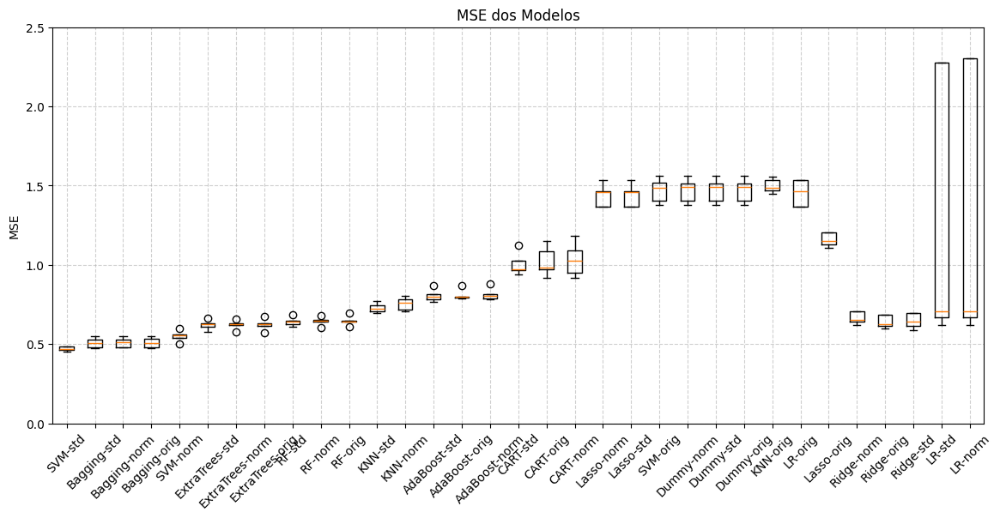

In [173]:
# Boxplot com limite no eixo y para melhor visualizacao
plt.figure(figsize=(14, 6))
plt.boxplot(results)
plt.xticks(range(1, len(names_models)+1), names_models, rotation=45)
plt.title('MSE dos Modelos')
plt.ylabel('MSE')
plt.ylim(0, 2.5)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

2. **Análise da Correlação**

Aqui analisamos a correlação entre o **logD experimental** e o **logD previsto** pelos modelos.

- **Modelos Vencedores: Previsões Confiáveis**

O modelo **SVM-std** se destaca como o melhor em termos de ajuste. A nuvem de pontos é densa e acompanha de perto a linha de referência (linha vermelha), especialmente no centro, captando muito bem a tendência geral dos dados.  

Os modelos de **ensemble** (`Bagging`, `ExtraTrees`, `RandomForest`) também apresentam um padrão sólido. Embora a dispersão seja ligeiramente maior nas extremidades, a relação linear entre os valores reais e preditos permanece clara e forte.

- **Modelos Medianos**

Os modelos **KNN-std/norm** apresentam uma nuvem de pontos mais espalhada em comparação com SVM ou Bagging, mas ainda seguem a linha vermelha.  

O modelo **AdaBoost**, apesar de ter bom desempenho em termos de MSE, apresenta maior dispersão na nuvem de pontos e uma leve assimetria nas previsões.  

O modelo **CART** (árvore de decisão única) mostra dispersão ainda maior, com uma nuvem mais larga. Isso evidencia que árvores individuais são menos robustas do que ensembles de árvores.

- **Modelos que Falharam**

O **DummyRegressor**, que prevê apenas a média, gera uma linha horizontal de pontos preditos. Isso demonstra que qualquer modelo com R² próximo ao Dummy não está aprendendo nada com as features.  

O **SVM-orig** (sem pré-processamento) também falha completamente, mostrando uma linha de predição quase horizontal, semelhante ao Dummy. Isso reforça que o SVR, apesar de robusto, requer que os dados estejam **normalizados ou padronizados** para funcionar corretamente.  

Os modelos lineares (**LR, Lasso, Ridge**) falham completamente no ajuste. As previsões estão concentradas em linhas horizontais ou pequenos aglomerados discretos, quase como previsões categóricas, em vez de formar uma nuvem alinhada com os valores reais.  

O **LR-std** apresenta uma predição em uma linha próxima a zero e um outlier extremamente distante, confirmando a instabilidade que gerou o MSE gigantesco (~10²⁹) observado no boxplot.


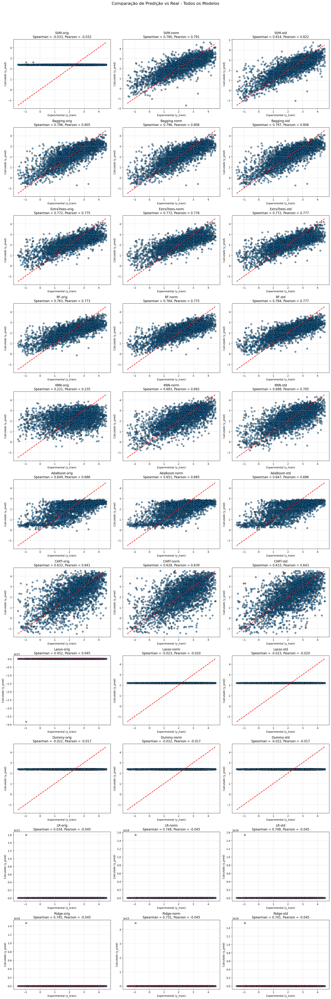

In [174]:
# Lista de tipos de pré-processamento
preparacoes = ["orig", "norm", "std"]

# Extrai os nomes base dos modelos, removendo os sufixos -orig/-norm/-std
model_bases = df_results_filtered['Modelo'].apply(lambda x: x.split('-')[0]).unique()

# Número de modelos base
n_models = len(model_bases)

# # Configura o tamanho da figura, aumentando a altura proporcional ao número de modelos
plt.figure(figsize=(18, 5 * n_models))

# Loop sobre cada modelo base
for row_idx, model_base in enumerate(model_bases):

    # Loop sobre cada tipo de pré-processamento
    for col_idx, prep in enumerate(preparacoes):

        # Seleciona as linhas do dataframe correspondentes ao modelo atua
        model_name = f"{model_base}-{prep}"
        df_model = df_results_filtered[df_results_filtered['Modelo'] == model_name]

        # Calcula o índice do subplot
        plt_idx = row_idx * 3 + col_idx + 1
        plt.subplot(n_models, 3, plt_idx)

        # Verifica se existem resultados para o modelo
        if not df_model.empty:

            # Converte as strings armazenadas no CSV de volta para arrays numpy
            y_train = np.array(ast.literal_eval(df_model.iloc[0]['y_train']))
            y_pred = np.array(ast.literal_eval(df_model.iloc[0]['y_pred']))


            # Obtém Spearman e Pearson
            spearman_corr = df_model.iloc[0]['Spearman']
            pearson_corr = df_model.iloc[0]['Pearson']

            # Plota o scatter plot de valores reais vs predito
            plt.scatter(y_train, y_pred, alpha=0.6, edgecolor='k')
            plt.plot([y_train.min(), y_train.max()],
                     [y_train.min(), y_train.max()], 'r--', lw=2)

            plt.xlabel('Experimental (y_train)')
            plt.ylabel('Calculado (y_pred)')
            plt.title(f'{model_name}\nSpearman = {spearman_corr:.3f}, Pearson = {pearson_corr:.3f}')
            plt.grid(True, linestyle='--', alpha=0.6)

# Título geral da figura
plt.suptitle("Comparação de Predição vs Real - Todos os Modelos", fontsize=16)

# Ajusta o layout para que os subplots não se sobreponham
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

3. **Análise dos Resultados Tabelados**

Confirmando a análise anterior, os melhores modelos em termos de RMSE, MAE e R² são o SVM-std, Bagging-std/norm/orig e ExtraTrees-std/norm/orig, sendo o SVM-std o vencedor claro. Este modelo apresenta o menor MAE (0.511) e RMSE (0.687), além do melhor R² (0.672), indicando que ele consegue explicar cerca de 67% da variância da variável alvo.  

Os modelos Bagging e ExtraTrees vêm em seguida, com valores de MAE e RMSE muito próximos, independentemente do pré-processamento utilizado (-std, -norm, -orig). Isso demonstra que modelos baseados em árvores são inerentemente robustos a variações na escala e distribuição dos dados.  

Também é possível observar numericamente a falha dos modelos lineares devido à não-normalidade da variável alvo e à presença de outliers extremos. Nesses casos, o RMSE chega à ordem de 10¹³ e o MAE à ordem de 10¹¹, números extremamente altos. Um R² negativo indica que o modelo é pior do que simplesmente prever a média da variável alvo, e os valores negativos extremos mostram que esses modelos fizeram previsões desastrosas em pelo menos um fold da validação cruzada.  

O DummyRegressor, que prevê apenas a média, apresenta um R² de −0.022. Modelos como Lasso-norm/std, SVM-orig e KNN-orig tiveram R² semelhantes ou ainda piores, confirmando que, sem pré-processamento adequado ou penalização correta, esses modelos são praticamente inúteis para este conjunto de dados.


In [175]:
df_results_filtered

,Modelo,MAE,RMSE,R2,Spearman,Pearson,Tempo(s),CV_MSE,y_train,y_pred
1,SVM-std,5.110000e-01,6.870000e-01,6.720000e-01,0.814,0.822,14.139,"[0.4879851294976194, 0.45218570791020984, 0.47...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0499013765530787, 1.5997206632515129, 3.188..."
2,Bagging-std,5.400000e-01,7.130000e-01,6.470000e-01,0.797,0.806,379.360,"[0.552248141182765, 0.508917393982785, 0.52834...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.963133333333334, 1.6026999999999996, 2.9627..."
3,Bagging-norm,5.420000e-01,7.140000e-01,6.450000e-01,0.796,0.806,377.174,"[0.5511516686603616, 0.5111553338951739, 0.529...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.9813333333333354, 1.5674, 2.979416666666667..."
4,Bagging-orig,5.410000e-01,7.140000e-01,6.450000e-01,0.796,0.805,397.080,"[0.5511273706875167, 0.5091103167524553, 0.533...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.998400000000001, 1.5546, 2.963183333333335,..."
5,SVM-norm,5.710000e-01,7.430000e-01,6.160000e-01,0.780,0.791,13.959,"[0.5982099841058519, 0.5579961644162222, 0.540...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.170181796617884, 1.6751418509982599, 2.8102..."
8,ExtraTrees-std,5.950000e-01,7.870000e-01,5.690000e-01,0.772,0.777,10.782,"[0.661941092626488, 0.6070423986755953, 0.6262...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.2135000000000016, 1.6999999999999986, 2.987..."
9,ExtraTrees-norm,5.990000e-01,7.890000e-01,5.670000e-01,0.772,0.776,7.621,"[0.660073786376488, 0.6201560187872024, 0.6316...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.028500000000001, 1.6999999999999986, 3.0263..."
10,ExtraTrees-orig,5.990000e-01,7.900000e-01,5.660000e-01,0.772,0.775,15.149,"[0.6730892876190476, 0.6172112039434525, 0.626...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[1.9708000000000008, 1.6999999999999986, 3.072..."
12,RF-std,6.190000e-01,8.010000e-01,5.540000e-01,0.764,0.777,11.169,"[0.6875129536715257, 0.6466534759696774, 0.624...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0568999999999993, 1.7861000000000002, 2.980..."
13,RF-norm,6.200000e-01,8.040000e-01,5.510000e-01,0.764,0.775,11.280,"[0.6809078042295154, 0.6462689540448792, 0.643...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[1.9279000000000004, 1.7834, 2.982630952380953..."


### 3.3 Hiperparametrização

A etapa de hiperparametrização foi aplicada apenas aos melhores algoritmos identificados na fase anterior. Optou-se por utilizar a preparação padrão dos dados (-std), uma vez que essa transformação apresentou o melhor desempenho no modelo de referência (SVM-std).  

No caso do KNN, a primeira busca foi realizada em torno de valores de vizinhos próximos [3, 5, 7, 9, 11]. Essa configuração, no entanto, resultou em um claro overfitting: o modelo alcançou um R² de 1,0 no conjunto de treino, mas apenas 0,7 no conjunto de teste. Para mitigar o problema, a busca foi refeita em uma faixa mais ampla de vizinhos [5, 9, 15, 21, 31, 51], o que proporcionou um equilíbrio mais adequado entre viés e variância.  

O SVM-std também foi submetido à etapa de hiperparametrização, porém com um número reduzido de parâmetros. Isso ocorreu devido ao custo computacional elevado: ao tentar explorar todo o espaço de hiperparâmetros possíveis, o processo levou mais de 10 horas e acabou travando a execução no Google Colab.  

Como todas as buscas já haviam sido realizadas anteriormente, os melhores parâmetros encontrados foram armazenados em um dicionário. Dessa forma, a execução do notebook não repete esse processo exaustivo, evitando gasto de tempo e recursos desnecessários.


In [176]:
# Resultados obtidos em runs anteriores
best_params_dict = {
    'KNN-std': {'n_neighbors': 5, 'p': 1, 'weights': 'distance'},
    'CART-std': {'max_depth': 5, 'min_samples_split': 2, 'min_samples_leaf': 1},
    'RF-std': {'n_estimators': 200, 'max_features': 5, 'max_depth': None,'min_samples_split': 2, 'min_samples_leaf': 1},
    'ExtraTrees-std': {'n_estimators': 200, 'max_features': 5, 'max_depth': None, 'min_samples_split': 2, 'min_samples_leaf': 1},
    'SVM-std': {'C': 10, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'},
    'AdaBoost-std': {'estimator': None, 'learning_rate': 1.0, 'n_estimators': 200}
}

In [177]:
# Definição dos hiperparâmetros para cada modelo
param_grids = {
    'KNN-std': {
        'model__n_neighbors': [5, 9, 15, 21, 31, 51],
        'model__weights': ['uniform', 'distance'],
        'model__p': [1, 2]
    },
    'CART-std': {
        'model__max_depth': [None, 5, 10, 20],
        'model__min_samples_split': [2, 5, 10],
        'model__min_samples_leaf': [1, 2, 4]
    },
    'RF-std': {
        'model__n_estimators': [50, 100, 200],
        'model__max_features': [2, 3, 5],
        'model__max_depth': [None, 5, 10, 20],
        'model__min_samples_split': [2, 5, 10],
        'model__min_samples_leaf': [1, 2, 4]
    },
    'ExtraTrees-std': {
        'model__n_estimators': [50, 100, 200],
        'model__max_features': [2, 3, 5],
        'model__max_depth': [None, 5, 10, 20],
        'model__min_samples_split': [2, 5, 10],
        'model__min_samples_leaf': [1, 2, 4]
    },
    'SVM-std': {
        'model__kernel': ['linear', 'rbf'],
        'model__C': [0.1, 1, 10],
        'model__gamma': ['scale'],
        'model__degree': [2, 3]
    },
    'AdaBoost-std': {
        'model__n_estimators': [50, 100, 150, 200],
        'model__learning_rate': [0.01, 0.1, 1.0],
        'model__estimator': [None]
    }
}

# Dicionário para armazenar os melhores modelos encontrados
best_models = {}

# Loop dos modelos para hiperparametrização
for name in ['KNN-std', 'CART-std', 'RF-std', 'ExtraTrees-std', 'SVM-std','AdaBoost-std']:

    # Se o modelo já tem parâmetros conhecidos, pula o GridSearch
    if name in best_params_dict:
        print(f"{name} já possui parâmetros conhecidos. Pulando GridSearch.")

        # Cria o modelo usando os melhores parâmetros armazenados
        if name == 'KNN-std':
            model = KNeighborsRegressor(**best_params_dict[name])
        elif name == 'CART-std':
            model = DecisionTreeRegressor(**best_params_dict[name])
        elif name == 'RF-std':
            model = RandomForestRegressor(**best_params_dict[name])
        elif name == 'ExtraTrees-std':
            model = ExtraTreesRegressor(**best_params_dict[name])
        elif name == 'SVM-std':
            model = SVR(**best_params_dict[name])
        elif name == 'AdaBoost-std':
            model = AdaBoostRegressor(**best_params_dict[name])
        else:
            continue

        # Cria pipeline final com pré-processamento e modelo
        best_models[name] = Pipeline([
            ("pre", numeric_pipe_standard),
            ("model", model)
        ])

        continue

    # Se o modelo ainda não tem parâmetros, realiza GridSearchCV
    print(f"\nHiperparametrizando: {name}")

    # Seleciona a pipeline do modelo correspondente
    model_pipeline = next(model for n, model in models if n == name)
    param_grid = param_grids[name]

    # Configuração do GridSearchCV
    grid_search = GridSearchCV(model_pipeline, param_grid, cv=kfold, scoring='neg_mean_squared_error', n_jobs=-1)
    grid_search.fit(x_train, y_train)

    # Armazena o modelo com os melhores parâmetros
    best_models[name] = grid_search.best_estimator_

    # Atualiza o dicionário com os melhores parâmetros encontrados, removendo 'model__' do nome
    best_params_dict[name] = {k.replace('model__', ''): v for k, v in grid_search.best_params_.items()}

    print(f"Melhores parâmetros para {name}: {best_params_dict[name]}")
    print(f"MSE CV: {-grid_search.best_score_:.3f}")


KNN-std já possui parâmetros conhecidos. Pulando GridSearch.
CART-std já possui parâmetros conhecidos. Pulando GridSearch.
RF-std já possui parâmetros conhecidos. Pulando GridSearch.
ExtraTrees-std já possui parâmetros conhecidos. Pulando GridSearch.
SVM-std já possui parâmetros conhecidos. Pulando GridSearch.
AdaBoost-std já possui parâmetros conhecidos. Pulando GridSearch.


In [178]:
# Lista para armazenar o resumo dos resultados de cada modelo
summary_results = []

# Loop sobre cada modelo otimizado (com melhores hiperparâmetros)
for name, pipeline in best_models.items():
    # Marca o momento que o treinamento começou
    start_time = time.time()

    # Cross-validation predictions com o pipeline completo
    y_pred = cross_val_predict(pipeline, x_train, y_train, cv=kfold)
    cv_results = cross_val_score(pipeline, x_train, y_train, cv=kfold, scoring='neg_mean_squared_error')

    # Calcula o tempo que demorou para treinar o modelo
    elapsed_time = time.time() - start_time

    # Avaliação das métricas de regressão
    metrics = evaluate_regression(y_train, y_pred)

    summary_results.append({
        "Modelo": f"{name}_hiper",
        "MAE": metrics["MAE"],
        "RMSE": metrics["RMSE"],
        "R2": metrics["R2"],
        "Spearman": metrics["Spearman"],
        "Pearson": metrics["Pearson"],
        "CV_MSE": cv_mse_folds,
        "y_train": y_train.tolist(),
        "y_pred": y_pred.tolist(),
        "Tempo(s)": elapsed_time
    })

# Cria um DataFrame com os resultados de todos os modelos
df_hiper = pd.DataFrame(summary_results)

# Combina os resultados de modelos anteriores (df_results) com os modelos hiperparametrizados
df_combined = pd.concat([df_results, df_hiper], ignore_index=True)
df_combined = df_combined.sort_values(by="RMSE").round(3)

df_combined = df_combined.drop_duplicates(subset='Modelo', keep='first')

# Salvando o DataFrame consolidado
df_combined.to_csv(results_csv, index=False)

### 3.4 Avaliação dos Modelos Hiperparametrizados

1. **Análise das métricas**

A hiperparametrização trouxe melhorias no desempenho de todos os modelos otimizados, sendo o ganho mais notável observado no SVM. A otimização refinou a margem de erro ϵ e os parâmetros do kernel do SVR, elevando o R² para 0,701, o que significa que o modelo agora consegue explicar cerca de 70% da variância da variável alvo, enquanto o MAE caiu para 0,473, indicando uma redução significativa no erro médio das previsões.  

O ExtraTrees apresentou um aumento de aproximadamente 4% no R². Embora esse modelo já fosse robusto, a hiperparametrização ajustou melhor a estrutura das árvores, melhorando seu desempenho. O Random Forest também obteve uma melhoria de 3% no R². O KNN, por sua vez, teve um ganho expressivo superior a 12%, refletindo sua alta sensibilidade aos hiperparâmetros, especialmente ao número de vizinhos K, e à escala dos dados.  

O CART, árvore única, apresentou uma melhoria ainda mais significativa, superior a 58%. Isso se deve à sensibilidade do modelo à profundidade e à divisão dos nós; a otimização conseguiu reduzir tanto o overfitting quanto o underfitting extremo do modelo base. Já o AdaBoost não apresentou ganhos relevantes com a hiperparametrização, mostrando-se menos sensível às alterações de parâmetros nesse conjunto de dados.  

No geral, a hiperparametrização do SVM com padronização (SVM-std_hiper) resultou no **melhor modelo global**, consolidando-o como referência para predição de logD neste estudo.


In [179]:
df_combined

,Modelo,MAE,RMSE,R2,Spearman,Pearson,Tempo(s),CV_MSE,y_train,y_pred
0,SVM-std_hiper,4.730000e-01,6.560000e-01,7.010000e-01,0.831,0.838,19.512,"[0.8806701565684579, 0.8025372600651867, 0.790...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.2672630256399975, 1.5999326150002575, 3.229..."
1,SVM-std,5.110000e-01,6.870000e-01,6.720000e-01,0.814,0.822,14.139,"[0.4879851294976194, 0.45218570791020984, 0.47...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0499013765530787, 1.5997206632515129, 3.188..."
2,Bagging-std,5.400000e-01,7.130000e-01,6.470000e-01,0.797,0.806,379.360,"[0.552248141182765, 0.508917393982785, 0.52834...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.963133333333334, 1.6026999999999996, 2.9627..."
4,Bagging-orig,5.410000e-01,7.140000e-01,6.450000e-01,0.796,0.805,397.080,"[0.5511273706875167, 0.5091103167524553, 0.533...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.998400000000001, 1.5546, 2.963183333333335,..."
3,Bagging-norm,5.420000e-01,7.140000e-01,6.450000e-01,0.796,0.806,377.174,"[0.5511516686603616, 0.5111553338951739, 0.529...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.9813333333333354, 1.5674, 2.979416666666667..."
5,SVM-norm,5.710000e-01,7.430000e-01,6.160000e-01,0.780,0.791,13.959,"[0.5982099841058519, 0.5579961644162222, 0.540...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.170181796617884, 1.6751418509982599, 2.8102..."
6,ExtraTrees-std_hiper,5.780000e-01,7.650000e-01,5.930000e-01,0.782,0.788,19.683,"[0.8806701565684579, 0.8025372600651867, 0.790...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.0878000000000014, 1.6999999999999937, 3.040..."
7,RF-std_hiper,6.050000e-01,7.850000e-01,5.710000e-01,0.772,0.784,28.225,"[0.8806701565684579, 0.8025372600651867, 0.790...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.257416666666667, 1.7419499999999954, 3.0957..."
8,ExtraTrees-std,5.950000e-01,7.870000e-01,5.690000e-01,0.772,0.777,10.782,"[0.661941092626488, 0.6070423986755953, 0.6262...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.2135000000000016, 1.6999999999999986, 2.987..."
9,ExtraTrees-norm,5.990000e-01,7.890000e-01,5.670000e-01,0.772,0.776,7.621,"[0.660073786376488, 0.6201560187872024, 0.6316...","[2.48, 1.7, 3.27, 3.09, 1.78, 3.28, 2.7, 3.8, ...","[2.028500000000001, 1.6999999999999986, 3.0263..."


2. Análise da Correlação

Nesta etapa, comparamos o desempenho dos modelos antes e depois da hiperparametrização em termos da correlação entre o logD experimental e o logD previsto pelos modelos. Essa análise visual complementa as observações já feitas na tabela `df_combined`.

A nuvem de pontos do SVM-std_hiper está visivelmente mais concentrada e estreita ao longo da linha vermelha quando comparada ao SVM-std, refletindo um ajuste mais preciso. No ExtraTrees, observa-se uma ligeira melhora na concentração dos pontos, resultando em um aumento da correlação de 0,777 para 0,788. O Random Forest, de forma semelhante ao ExtraTrees, apresenta apenas um ganho marginal; a densidade da nuvem e a dispersão se alteram minimamente após a hiperparametrização.

O KNN-std_hiper mostra uma nuvem de pontos claramente mais próxima da linha de referência. A correlação de Pearson aumenta de 0,705 para 0,748, refletindo o significativo ganho no R² observado na tabela e confirmando que a otimização teve um impacto crítico para o KNN, mais do que para os modelos de árvore.

No gráfico do CART-std_hiper, é possível visualizar linhas horizontais formadas pelos pontos. Isso indica que a hiperparametrização provavelmente gerou uma árvore mais superficial para evitar overfitting. Limitar a profundidade máxima ou aumentar o número mínimo de amostras por nó terminal reduz o número de valores médios discretos que o modelo pode prever, tornando os “degraus” horizontais mais evidentes no gráfico.

Por fim, o AdaBoost apresenta pouca melhora após a hiperparametrização. O modelo falha em prever valores altos, truncando as previsões acima de aproximadamente 3,0, gerando uma concentração horizontal de pontos nessa faixa. Dessa forma, a otimização não conseguiu corrigir essa limitação estrutural, resultando apenas em um ganho mínimo na correlação, de 0,686 para 0,691.



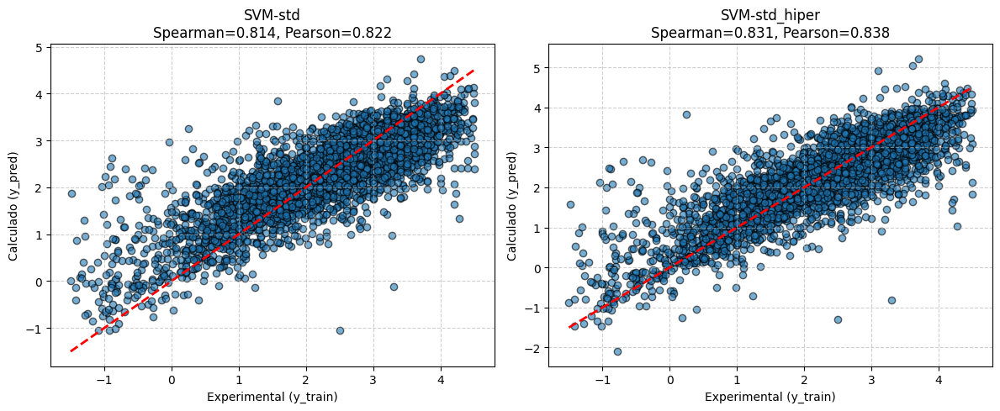

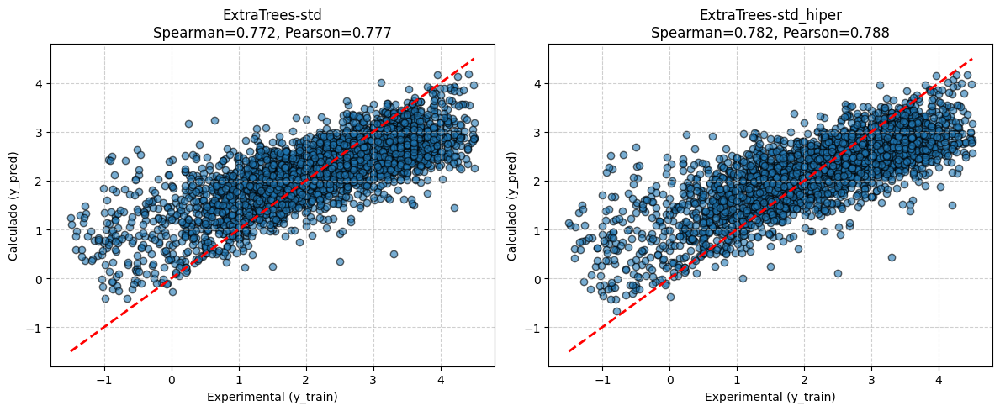

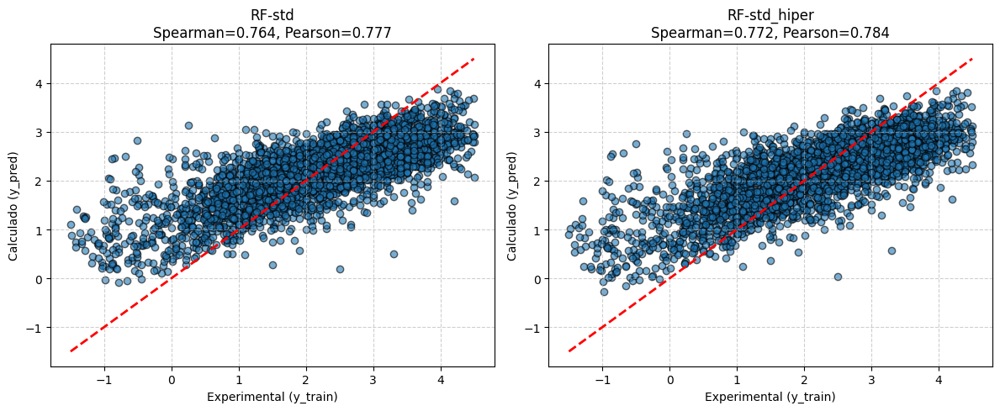

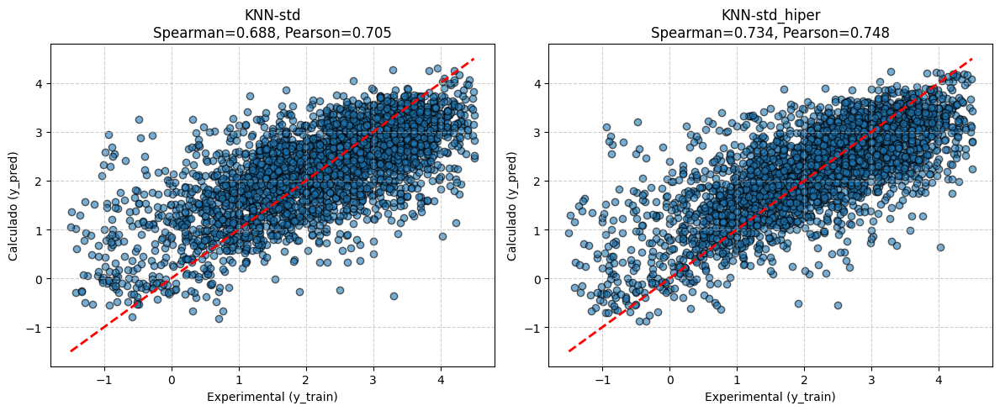

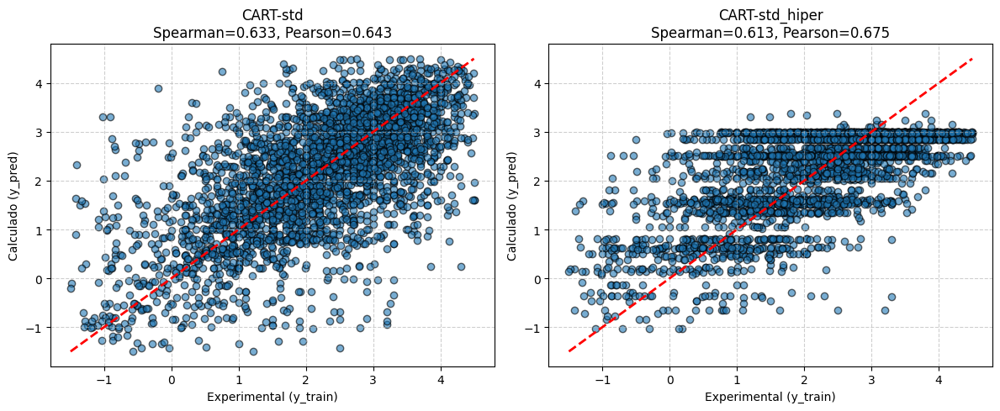

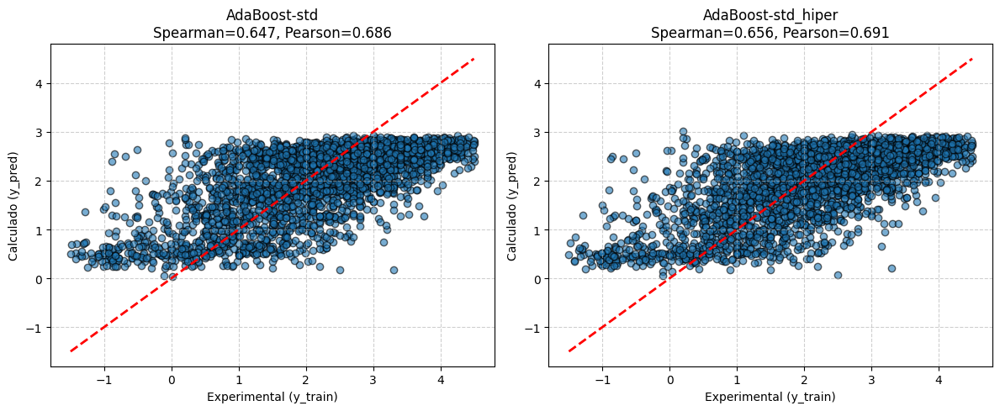

In [180]:
# Lista dos modelos "originais"
modelos_base = ['SVM-std','ExtraTrees-std','RF-std', 'KNN-std', 'CART-std', 'AdaBoost-std']

for modelo in modelos_base:
    modelo_hiper = modelo + "_hiper"

    # Filtra os dados do dataframe para cada modelo
    row_base = df_combined[df_combined['Modelo'] == modelo].iloc[0]
    row_hiper = df_combined[df_combined['Modelo'] == modelo_hiper].iloc[0]

    # Converte as strings armazenadas de volta para arrays numpy
    # Modelo base
    if isinstance(row_base['y_train'], str):
        y_train_base = np.array(ast.literal_eval(row_base['y_train']))
    else:
        y_train_base = np.array(row_base['y_train'])
    if isinstance(row_base['y_pred'], str):
        y_pred_base = np.array(ast.literal_eval(row_base['y_pred']))
    else:
        y_pred_base = np.array(row_base['y_pred'])

    # Modelo hiper
    if isinstance(row_hiper['y_train'], str):
        y_train_hiper = np.array(ast.literal_eval(row_hiper['y_train']))
    else:
        y_train_hiper = np.array(row_hiper['y_train'])
    if isinstance(row_hiper['y_pred'], str):
        y_pred_hiper = np.array(ast.literal_eval(row_hiper['y_pred']))
    else:
        y_pred_hiper = np.array(row_hiper['y_pred'])

    # Correlações
    spearman_base = row_base['Spearman']
    pearson_base = row_base['Pearson']

    spearman_hiper = row_hiper['Spearman']
    pearson_hiper = row_hiper['Pearson']

    # Cria figura com 2 subplots lado a lado
    fig, axes = plt.subplots(1, 2, figsize=(12,5))

    # Primeiro gráfico: modelo base
    axes[0].scatter(y_train_base, y_pred_base, alpha=0.6, edgecolor='k')
    axes[0].plot([y_train_base.min(), y_train_base.max()],
                 [y_train_base.min(), y_train_base.max()], 'r--', lw=2)
    axes[0].set_xlabel('Experimental (y_train)')
    axes[0].set_ylabel('Calculado (y_pred)')
    axes[0].set_title(f'{modelo}\nSpearman={spearman_base:.3f}, Pearson={pearson_base:.3f}')
    axes[0].grid(True, linestyle='--', alpha=0.6)

    # Segundo gráfico: modelo _hiper
    axes[1].scatter(y_train_hiper, y_pred_hiper, alpha=0.6, edgecolor='k')
    axes[1].plot([y_train_hiper.min(), y_train_hiper.max()],
                 [y_train_hiper.min(), y_train_hiper.max()], 'r--', lw=2)
    axes[1].set_xlabel('Experimental (y_train)')
    axes[1].set_ylabel('Calculado (y_pred)')
    axes[1].set_title(f'{modelo_hiper}\nSpearman={spearman_hiper:.3f}, Pearson={pearson_hiper:.3f}')
    axes[1].grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()

### 3.5 Validação dos modelos

In [181]:
# Adicionar sufixo _hiper aos modelos otimizados
best_models_hiper = {f"{name}_hiper": model for name, model in best_models.items()}

# Filtrar apenas modelos com sufixo '-std' nos modelos baseline
std_models = {name: model for name, model in models if name.endswith('-std')}

# Combinar todos os modelos: baselines e os hiperparametrizados
all_models = std_models.copy()
all_models.update(best_models_hiper)

# Nome das tabelas com os resultados
results_csv = os.path.join(model_dir, "final_results.csv")
predictions_csv = os.path.join(model_dir, "predictions_summary.csv")

# Carrega resultados existentes se os arquivos existirem, senão inicializa listas vazias
if os.path.exists(results_csv):
    all_results_df = pd.read_csv(results_csv)
    final_results = all_results_df.to_dict(orient="records")
else:
    final_results = []

if os.path.exists(predictions_csv):
    predictions_df = pd.read_csv(predictions_csv)
    predictions_summary = predictions_df.to_dict(orient="records")
else:
    predictions_summary = []

# Loop para treinar e avaliar os modelos com o treino e teste
for name, model in all_models.items():

    # Verifica se o modelo já está presente nas listas
    existing_models_results = [r["Modelo"] for r in final_results]
    existing_models_predictions = [r["Modelo"] for r in predictions_summary]

    if name in existing_models_results and name in existing_models_predictions:
        print(f"Modelo {name} já presente nos arquivos CSV, pulando treinamento")
        continue

    # Caso modelo esteja ausente nas listas
    print(f"Treinando e avaliando: {name}")

    # Treinar modelo com todo o conjunto de treino
    model.fit(x_train, y_train)

    # Previsões para o treino e teste
    y_train_pred = model.predict(x_train)
    y_test_pred = model.predict(x_test)

    # Avaliar métricas (MAE, RMSE, R2, Spearman e Pearson)
    train_metrics = evaluate_regression(y_train, y_train_pred)
    test_metrics = evaluate_regression(y_test, y_test_pred)

    # Salvar resultados da avaliação
    final_results.append({
        "Modelo": name,
        "Treino MAE": train_metrics["MAE"],
        "Treino RMSE": train_metrics["RMSE"],
        "Treino R2": train_metrics["R2"],
        "Treino Spearman": train_metrics["Spearman"],
        "Treino Pearson": train_metrics["Pearson"],
        "Teste MAE": test_metrics["MAE"],
        "Teste RMSE": test_metrics["RMSE"],
        "Teste R2": test_metrics["R2"],
        "Teste Spearman": test_metrics["Spearman"],
        "Teste Pearson": test_metrics["Pearson"]
    })

    # Salvar resultados das previsões
    predictions_summary.append({
      "Modelo": name,
      "y_train": y_train.tolist(),
      "y_train_pred": y_train_pred.tolist(),
      "y_test": y_test.tolist(),
      "y_test_pred": y_test_pred.tolist()
    })


Modelo Dummy-std já presente nos arquivos CSV, pulando treinamento
Modelo LR-std já presente nos arquivos CSV, pulando treinamento
Modelo Ridge-std já presente nos arquivos CSV, pulando treinamento
Modelo Lasso-std já presente nos arquivos CSV, pulando treinamento
Modelo KNN-std já presente nos arquivos CSV, pulando treinamento
Modelo CART-std já presente nos arquivos CSV, pulando treinamento
Modelo SVM-std já presente nos arquivos CSV, pulando treinamento
Modelo RF-std já presente nos arquivos CSV, pulando treinamento
Modelo ExtraTrees-std já presente nos arquivos CSV, pulando treinamento
Modelo Bagging-std já presente nos arquivos CSV, pulando treinamento
Modelo AdaBoost-std já presente nos arquivos CSV, pulando treinamento
Modelo KNN-std_hiper já presente nos arquivos CSV, pulando treinamento
Modelo CART-std_hiper já presente nos arquivos CSV, pulando treinamento
Modelo RF-std_hiper já presente nos arquivos CSV, pulando treinamento
Modelo ExtraTrees-std_hiper já presente nos arquivo

1. **Análise das Métricas de Avaliação**

Nesta etapa, o foco é identificar o modelo mais generalista, capaz de prever bem sem sofrer overfitting. Modelos como ExtraTrees-hiper, KNN-hiper e CART-std atingiram um R² perfeito de 1,0 no conjunto de treinamento, com RMSE de apenas 0,015. Esse desempenho indica que esses modelos memorizaram o ruído dos dados, e quando avaliados no conjunto de teste, o R² despenca para 0,603 (ExtraTrees), 0,579 (KNN) e 0,349 (CART), evidenciando o overfitting extremo.

O melhor modelo é aquele que combina alto desempenho no teste com uma diferença pequena entre as métricas de treino e teste, alcançando um bom equilíbrio entre viés e variância. Nesse critério, o SVM-std_hiper se destaca como vencedor claro: apresenta um R² de 0,718 no conjunto de teste, explicando cerca de 71,8% da variância, além de ter o menor RMSE (0,645). Suas correlações também são as mais altas, com Pearson de 0,848 e Spearman de 0,834, confirmando a qualidade do ajuste.

Embora o Ridge e o Linear Regression tenham apresentado resultados melhores no teste de validação simples do que na validação cruzada — onde mostraram instabilidade extrema — eles ainda ficam significativamente atrás do SVM. Isso reforça a ineficácia dos modelos lineares para predizer o logD em um conjunto de dados com distribuição não normal e presença de outliers.


In [182]:
# Convertendo final_results e predictions_summary para DataFrames
df_all_results = pd.DataFrame(final_results)
df_predictions = pd.DataFrame(predictions_summary)

# Organizando a tabela de predicoes
if os.path.exists(predictions_csv):
    df_predictions_all = pd.read_csv(predictions_csv)

    if df_predictions.empty:
        # Caso predictions_summary esteja vazio, usar predictions_all
        df_predictions = df_predictions_all
    else:
        # Caso haja conteúdo em ambos, fazer merge
        df_predictions = pd.concat([df_predictions, df_predictions_all], ignore_index=True)
else:
    # Caso não exista predictions_all, usar predictions_summary
    df_predictions = df_predictions

# Remover duplicatas considerando apenas o nome do modelo
df_predictions = df_predictions.drop_duplicates(subset='Modelo', keep='first')

# Organizando a tabela all_results
if os.path.exists(results_csv):
    df_results_all = pd.read_csv(results_csv)

    if df_all_results.empty:
        # Caso final_results esteja vazio, usar results_all
        df_all_results = df_results_all
    else:
        # Caso haja conteúdo em ambos, fazer merge
        df_all_results = pd.concat([df_all_results, df_results_all], ignore_index=True)
else:
    # Caso não exista results_all, usar final_results
    df_all_results = df_all_results

# Remover duplicatas considerando apenas o nome do modelo
df_all_results = df_all_results.drop_duplicates(subset='Modelo', keep='first')

# Ordenando pelo RMSE e arredondando
df_all_results = df_all_results.sort_values(by='Teste RMSE').round(3)
df_all_results

,Modelo,Treino MAE,Treino RMSE,Treino R2,Treino Spearman,Treino Pearson,Teste MAE,Teste RMSE,Teste R2,Teste Spearman,Teste Pearson
0,SVM-std_hiper,0.122,0.185,0.976,0.988,0.988,0.454,0.645,0.718,0.834,0.848
1,SVM-std,0.328,0.483,0.838,0.921,0.921,0.494,0.680,0.687,0.813,0.832
2,Bagging-std,0.196,0.263,0.952,0.982,0.982,0.537,0.712,0.657,0.785,0.813
3,ExtraTrees-std_hiper,0.002,0.015,1.000,1.000,1.000,0.571,0.766,0.603,0.773,0.793
4,RF-std_hiper,0.218,0.285,0.943,0.986,0.986,0.595,0.783,0.585,0.763,0.789
5,ExtraTrees-std,0.002,0.015,1.000,1.000,1.000,0.588,0.787,0.581,0.764,0.782
6,KNN-std_hiper,0.002,0.015,1.000,1.000,1.000,0.575,0.789,0.579,0.735,0.763
7,Ridge-std,0.577,0.735,0.625,0.779,0.790,0.625,0.789,0.579,0.732,0.761
8,LR-std,0.565,0.721,0.639,0.791,0.799,0.625,0.790,0.578,0.736,0.761
9,RF-std,0.226,0.296,0.939,0.985,0.985,0.610,0.803,0.564,0.754,0.780


2. **Análise dos Gráficos de Correlação**

No gráfico do SVM-std_hiper para o conjunto de treino, a nuvem de pontos é extremamente estreita e alinhada com a linha vermelha (Pearson = 0,988), indicando um ajuste quase perfeito. No gráfico do conjunto de teste, a nuvem se alarga, mas continua sendo a mais densa e coesa entre todos os modelos. A queda na correlação para 0,848 é moderada e aceitável, demonstrando que o modelo generalizou bem para novos dados.

Nos modelos de árvores (Random Forest, ExtraTrees, CART) e no KNN, o gráfico de treino mostra uma linha preta quase perfeita, confirmando o R² de 1,0 e evidenciando memorização dos dados. Já no gráfico de teste, a nuvem de pontos se espalha consideravelmente e se desalinha da linha vermelha, indicando overfitting extremo e tornando esses modelos menos adequados para este conjunto de dados.

O AdaBoost mantém o comportamento observado durante a hiperparametrização, com truncamento das previsões em um valor máximo, limitando sua capacidade de ajuste. O Linear Regression e o Ridge, apesar de apresentarem desempenho melhor que na validação cruzada, ainda mostram nuvens de pontos muito dispersas tanto no treino quanto no teste. O Lasso, como visto anteriormente, segue um padrão semelhante ao Dummy, prevendo essencialmente a média da variável alvo.

O Bagging-std se mostra um modelo excelente e muito robusto, quase indiferente à padronização dos dados, conforme observado nas análises anteriores. No entanto, mesmo com essa robustez, ainda fica atrás do SVM em termos de ajuste ao conjunto de treino e generalização para o conjunto de teste.




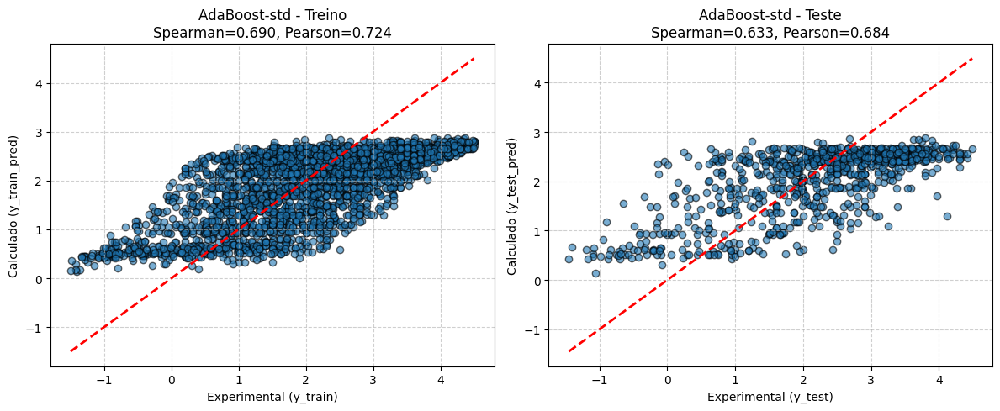

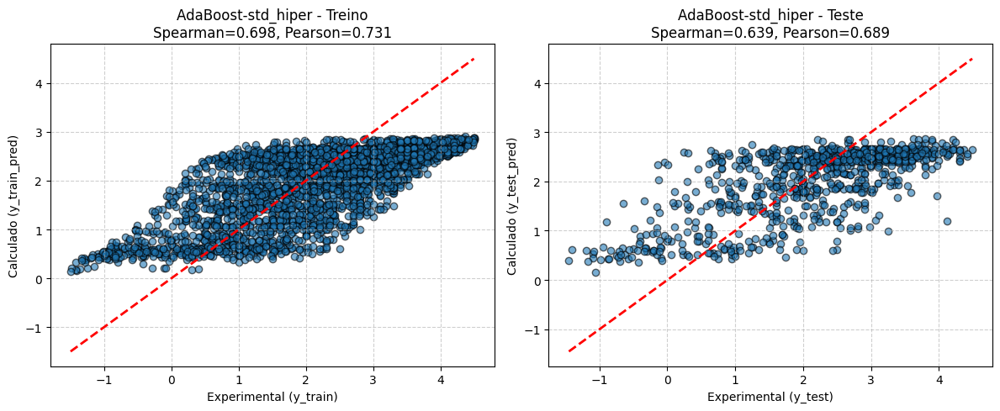

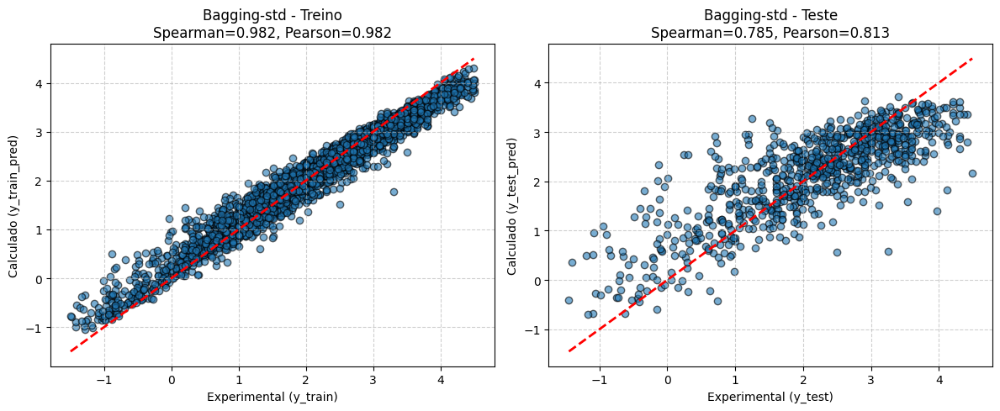

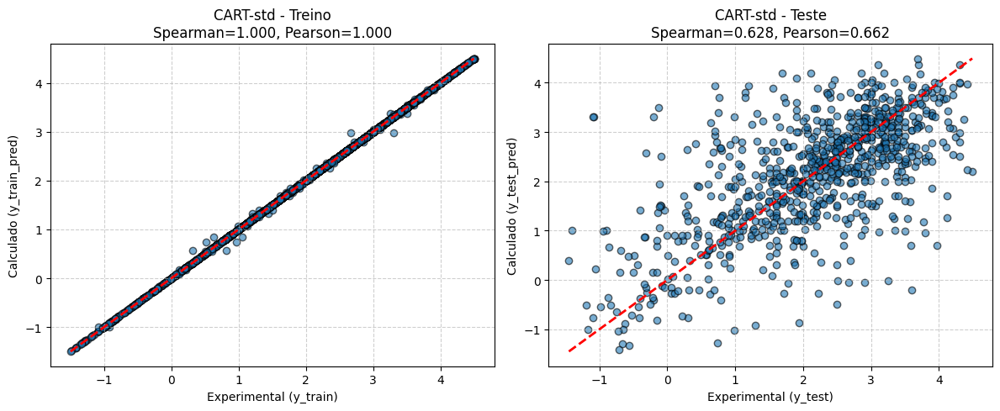

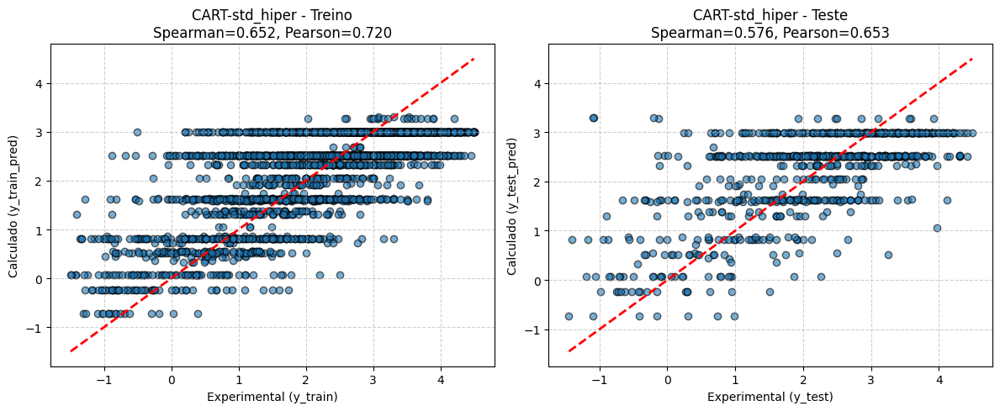

...

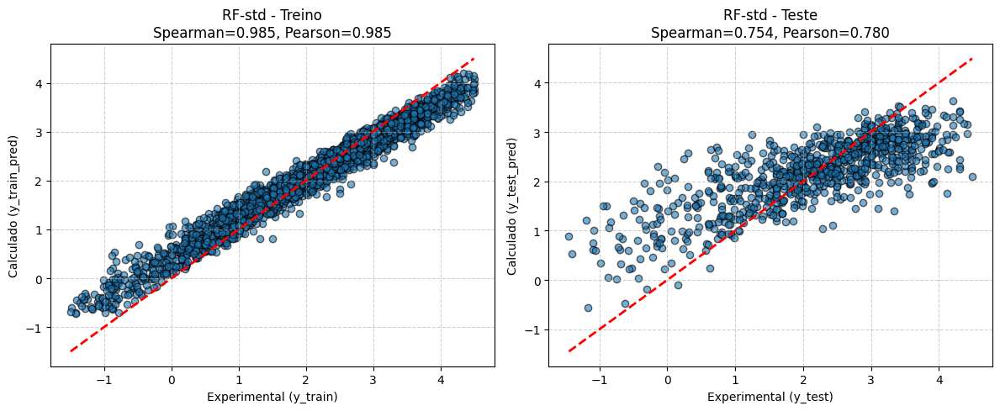

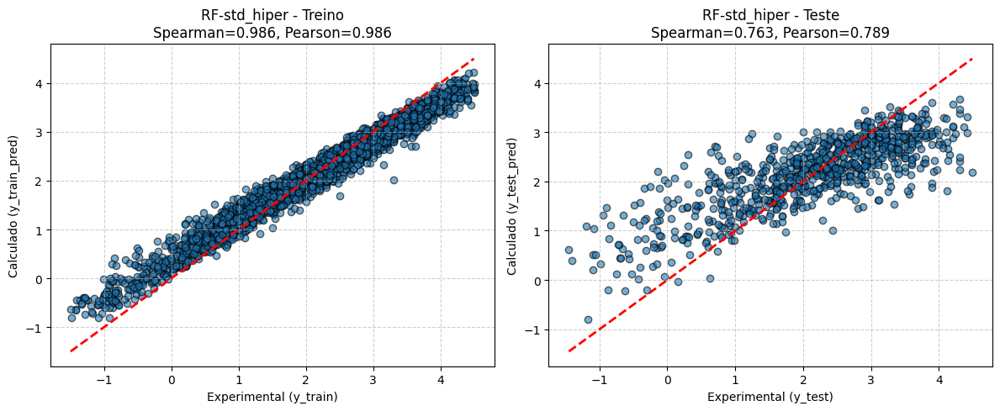

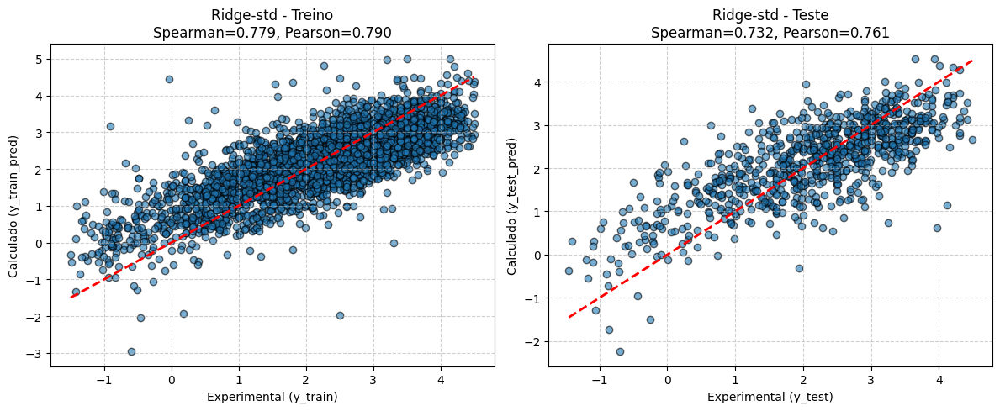

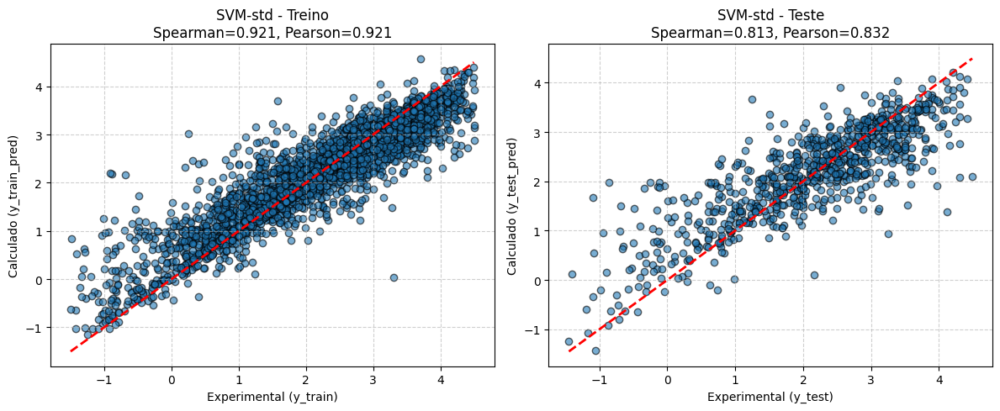

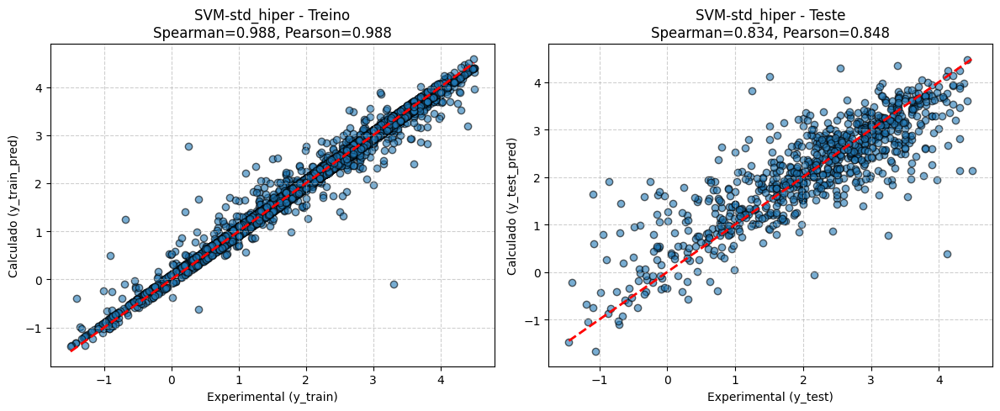

In [183]:
# Ordena df_predictions pelo nome do modelo
df_predictions = df_predictions.sort_values(by='Modelo')

# Itera sobre cada modelo em df_predictions
for idx, row in df_predictions.iterrows():
    modelo = row['Modelo']

    y_train = np.array(ast.literal_eval(row['y_train'])) if isinstance(row['y_train'], str) else np.array(row['y_train'])
    y_train_pred = np.array(ast.literal_eval(row['y_train_pred'])) if isinstance(row['y_train_pred'], str) else np.array(row['y_train_pred'])
    y_test = np.array(ast.literal_eval(row['y_test'])) if isinstance(row['y_test'], str) else np.array(row['y_test'])
    y_test_pred = np.array(ast.literal_eval(row['y_test_pred'])) if isinstance(row['y_test_pred'], str) else np.array(row['y_test_pred'])

    # Obtém Spearman e Pearson da tabela df_all_results
    res = df_all_results[df_all_results['Modelo'] == modelo].iloc[0]
    spearman_train = res['Treino Spearman']
    pearson_train = res['Treino Pearson']
    spearman_test = res['Teste Spearman']
    pearson_test = res['Teste Pearson']

    # Cria figura com 2 subplots lado a lado
    fig, axes = plt.subplots(1, 2, figsize=(12,5))

    # Gráfico treino
    axes[0].scatter(y_train, y_train_pred, alpha=0.6, edgecolor='k')
    axes[0].plot([min(y_train), max(y_train)],
                 [min(y_train), max(y_train)], 'r--', lw=2)
    axes[0].set_xlabel('Experimental (y_train)')
    axes[0].set_ylabel('Calculado (y_train_pred)')
    axes[0].set_title(f'{modelo} - Treino\nSpearman={spearman_train:.3f}, Pearson={pearson_train:.3f}')
    axes[0].grid(True, linestyle='--', alpha=0.6)

    # Gráfico teste
    axes[1].scatter(y_test, y_test_pred, alpha=0.6, edgecolor='k')
    axes[1].plot([min(y_test), max(y_test)],
                 [min(y_test), max(y_test)], 'r--', lw=2)
    axes[1].set_xlabel('Experimental (y_test)')
    axes[1].set_ylabel('Calculado (y_test_pred)')
    axes[1].set_title(f'{modelo} - Teste\nSpearman={spearman_test:.3f}, Pearson={pearson_test:.3f}')
    axes[1].grid(True, linestyle='--', alpha=0.6)

    plt.tight_layout()
    plt.show()

### 3.6 Salvamento do modelo final



In [184]:
# Seleciona o modelo
model = all_models['SVM-std_hiper']

# Treina com todo o conjunto de treino
model.fit(x_train, y_train)

# Salva o modelo treinado
model_path = os.path.join(model_dir, 'svm_std_hiper_model.joblib')
joblib.dump(model, model_path)

['/content/drive/MyDrive/models/svm_std_hiper_model.joblib']

In [185]:
# Carregar o modelo
loaded_model = joblib.load(model_path)

# Testar previsões com novos dados (ou com uma amostra do treino/teste)
y_pred = loaded_model.predict(x_train[:5])  # apenas exemplo com as 5 primeiras linhas
print(y_pred)

[2.57567901 1.66831628 3.17874861 3.06521683 0.98084958]


In [186]:
end_time = time.time()
print(f"Tempo total de execução: {end_time - start_time_note:.2f} segundos")

Tempo total de execução: 124.23 segundos


## 4. Limitacoes